# Molecular dynamics simulation trajectory analysis

## Setup

In [2]:
# Imports
import os
import subprocess

import math
import statistics

from pymol import cmd
print("Pymol version: ", cmd.get_version()[0])

import numpy as np
print("Numpy version: ", np.__version__)

import sklearn
from sklearn.cluster import AgglomerativeClustering
print("Sklearn version: ", sklearn.__version__)

import scipy
from scipy.stats import gaussian_kde
print("Scipy version: ", scipy.__version__)

import matplotlib
import matplotlib.pyplot as plt
print("Matplotlib version: ", matplotlib.__version__)

import pandas as pd
print("Pandas version: ", pd.__version__)

import seaborn as sns
print("Seaborn version: ", sns.__version__)


Pymol version:  3.0.0
Numpy version:  1.26.4
Sklearn version:  1.4.2
Scipy version:  1.13.0
Matplotlib version:  3.8.4
Pandas version:  2.2.2
Seaborn version:  0.13.2


In [3]:
# Change to the working directory
wrkdir = "/Users/familia/Documents/Research/projects/synthetic_opioids/U48800/rest/methanol/analysis"
os.chdir(wrkdir)

In [3]:
# Copy the gro file
os.system("cp ../U48800.gro .")
os.system("cp ../U48800.pdb .")

# Demux the log files
replicas = 10
for i in range(1, replicas + 1):
    os.system("cat ../replica%02d/mds.log > rest.log" % i)

os.system("demux.pl rest.log")

# Concatenate the trajectories
os.system("gmx trjcat -f ../replica01/mds.xtc ../replica02/mds.xtc ../replica03/mds.xtc ../replica04/mds.xtc ../replica05/mds.xtc ../replica06/mds.xtc ../replica07/mds.xtc ../replica08/mds.xtc ../replica09/mds.xtc ../replica10/mds.xtc -demux replica_index.xvg -o trajout.xtc")

# Center the molecule within the box
result = subprocess.run(["gmx", "trjconv", "-f", "0_trajout.xtc", "-s", "U48800.gro", "-pbc", "nojump", "-center", "-o", "trajout.xtc"], capture_output=True, text=True, cwd=wrkdir, input="2 2\n")
print(result.stderr)

-----------------------------------------------------------------
Going to read a file containing the exchange information from
your mdrun log file (rest.log).
This will produce a file (replica_index.xvg) suitable for
demultiplexing your trajectories using trjcat,
as well as a replica temperature file (replica_temp.xvg).
Each entry in the log file will be copied 0 times.
-----------------------------------------------------------------
There are 10 replicas.
Finished writing replica_index.xvg and replica_temp.xvg with 10000 lines


                      :-) GROMACS - gmx trjcat, 2024.1 (-:

Executable:   /opt/local/bin/gmx
Data prefix:  /opt/local
Working dir:  /Users/familia/Documents/Research/projects/synthetic_opioids/U48800/rest/methanol/analysis
Command line:
  gmx trjcat -f ../replica01/mds.xtc ../replica02/mds.xtc ../replica03/mds.xtc ../replica04/mds.xtc ../replica05/mds.xtc ../replica06/mds.xtc ../replica07/mds.xtc ../replica08/mds.xtc ../replica09/mds.xtc ../replica10/mds.xtc -demux replica_index.xvg -o trajout.xtc

Last frame      10000 time 10000.000   

GROMACS reminds you: "I Am a Poor Lonesome Cowboy" (Lucky Luke)



Note that major changes are planned in future for trjcat, to improve usability and utility.Read 10 sets of 10000 points, dt = 1

                     :-) GROMACS - gmx trjconv, 2024.1 (-:

Executable:   /opt/local/bin/gmx
Data prefix:  /opt/local
Working dir:  /Users/familia/Documents/Research/projects/synthetic_opioids/U48800/rest/methanol/analysis
Command line:
  gmx trjconv -f 0_trajout.xtc -s U48800.gro -pbc nojump -center -o trajout.xtc

Will write xtc: Compressed trajectory (portable xdr format): xtc
Group     0 (         System) has  4414 elements
Group     1 (          Other) has    46 elements
Group     2 (            SOP) has    46 elements
Group     3 (        Protein) has  4368 elements
Group     4 (      Protein-H) has  1456 elements
Group     5 (        C-alpha) has     0 elements
Group     6 (       Backbone) has   728 elements
Group     7 (      MainChain) has   728 elements
Group     8 (   MainChain+Cb) has   728 elements
Group     9 (    MainChain+H) has  2912 element

## Trajectory analysis

In [4]:
# Reinitialize and load molecule and trajectory as before
cmd.reinitialize()

# Set pymol to preserve numbering
cmd.set('retain_order', 1)

# Set background color to white
cmd.bg_color(color="white")

# Load the molecule and trajectory
cmd.load("U48800.pdb", "U48800")
cmd.load_traj("trajout.xtc", "U48800")
cmd.center("U48800")

 ObjectMolecule: read set 1 into state 1...
 ObjectMolecule: read set 2 into state 2...
 ObjectMolecule: read set 3 into state 3...
 ObjectMolecule: read set 4 into state 4...
 ObjectMolecule: read set 5 into state 5...
 ObjectMolecule: read set 6 into state 6...
 ObjectMolecule: read set 7 into state 7...
 ObjectMolecule: read set 8 into state 8...
 ObjectMolecule: read set 9 into state 9...
 ObjectMolecule: read set 10 into state 10...
 ObjectMolecule: read set 11 into state 11...
 ObjectMolecule: read set 12 into state 12...
 ObjectMolecule: read set 13 into state 13...
 ObjectMolecule: read set 14 into state 14...
 ObjectMolecule: read set 15 into state 15...
 ObjectMolecule: read set 16 into state 16...
 ObjectMolecule: read set 17 into state 17...
 ObjectMolecule: read set 18 into state 18...
 ObjectMolecule: read set 19 into state 19...
 ObjectMolecule: read set 20 into state 20...
 ObjectMolecule: read set 21 into state 21...
 ObjectMolecule: read set 22 into state 22...
 Objec

## Cyclohexane ring

In [5]:
# Determine the number of states
num_states = cmd.count_states("U48800")

# Align all states to the first state
cmd.intra_fit("U48800 and (id 4 or id 5 or id 6 or id 7 or id 8 or id 9)", 1)

# Define atoms selection
selection = "U48800 and (id 2 or id 5 or id 6 or id 7 or id 8 or id 9 or id 10 or id 29 or id 30 or id 31 or id 32 or id 33 or id 34 or id 35 or id 36 or id 37 or id 38)"

rmsd = []
for state in range(1, num_states + 1):
    r = cmd.intra_rms_cur(selection, state=state)
    r[state - 1] = 0
    rmsd.append(r)

In [6]:
# Create an instance of AgglomerativeClustering
clustering = AgglomerativeClustering(n_clusters=14, metric='precomputed', linkage='complete')

# Fit the model with your distance matrix
clusters = clustering.fit_predict(rmsd)
df = pd.DataFrame(clusters, columns=["Cluster"])
df["State"] = range(1, num_states + 1)

In [7]:
# Delete all existing cluster objects
cmd.delete("cluster_*")

# Create a new object for each cluster
grouped = df.groupby('Cluster')
clusters_name = []
for cluster, group_df in grouped:
    new_object_name = f"cluster_{cluster}"
    clusters_name.append(new_object_name)
    states = group_df['State'].tolist()
    
    for state in states:
        cmd.create(new_object_name, "U48800", state, -1)

# Hide the original object
cmd.disable("all")

In [8]:
# Create directory to save the clusters for visual analysis
os.makedirs("clusters", exist_ok=True)

# Save all clusters
cmd.save("clusters/ciclohexane_cluster_0.sdf", "cluster_0", state=0)
cmd.save("clusters/ciclohexane_cluster_1.sdf", "cluster_1", state=0)
cmd.save("clusters/ciclohexane_cluster_2.sdf", "cluster_2", state=0)
cmd.save("clusters/ciclohexane_cluster_3.sdf", "cluster_3", state=0)
cmd.save("clusters/ciclohexane_cluster_4.sdf", "cluster_4", state=0)
cmd.save("clusters/ciclohexane_cluster_5.sdf", "cluster_5", state=0)
cmd.save("clusters/ciclohexane_cluster_6.sdf", "cluster_6", state=0)
cmd.save("clusters/ciclohexane_cluster_7.sdf", "cluster_7", state=0)
cmd.save("clusters/ciclohexane_cluster_8.sdf", "cluster_8", state=0)
cmd.save("clusters/ciclohexane_cluster_9.sdf", "cluster_9", state=0)
cmd.save("clusters/ciclohexane_cluster_10.sdf", "cluster_10", state=0)
cmd.save("clusters/ciclohexane_cluster_11.sdf", "cluster_11", state=0)
cmd.save("clusters/ciclohexane_cluster_12.sdf", "cluster_12", state=0)
cmd.save("clusters/ciclohexane_cluster_13.sdf", "cluster_13", state=0)

In [9]:
# Join clusters after visual analysis of the results
# [ 0 B -14, 7 B -14 ]
df.loc[df['Cluster'] == 7, 'Cluster'] = 0

# [ 1 C +246, 3 C +246, 5 C +246, 13 C +246 ]
df.loc[df['Cluster'] == 3, 'Cluster'] = 1
df.loc[df['Cluster'] == 5, 'Cluster'] = 1
df.loc[df['Cluster'] == 13, 'Cluster'] = 1

# [ 2 C +135, 6 C +135, 9 C +135]
df.loc[df['Cluster'] == 6, 'Cluster'] = 2
df.loc[df['Cluster'] == 9, 'Cluster'] = 2

# [ 4 B +36 ]
df.loc[df['Cluster'] == 4, 'Cluster'] = 3

# [ 8 B -25, 10 B -25 ]
df.loc[df['Cluster'] == 8, 'Cluster'] = 4
df.loc[df['Cluster'] == 10, 'Cluster'] = 4

# [ 11 B +25, 12 B +25 ]
df.loc[df['Cluster'] == 11, 'Cluster'] = 5
df.loc[df['Cluster'] == 12, 'Cluster'] = 5

In [10]:
# Print the number of clusters_dbscan found
num_clusters = len(set(df['Cluster']))
print(f"Number of clusters_dbscan detected: {num_clusters}")

# Count the number of points in each cluster
cluster_counts = df['Cluster'].value_counts()

# Calculate the percentage of points in each cluster
cluster_percentages = cluster_counts / len(df) * 100

# Print cluster counts and percentages
for cluster_id, count in cluster_counts.items():
    percentage = cluster_percentages[cluster_id]
    print(f"Cluster {cluster_id}: {count} structures ({percentage:.2f}%)")

Number of clusters_dbscan detected: 6
Cluster 1: 8726 structures (87.25%)
Cluster 2: 1134 structures (11.34%)
Cluster 4: 74 structures (0.74%)
Cluster 3: 33 structures (0.33%)
Cluster 5: 24 structures (0.24%)
Cluster 0: 10 structures (0.10%)


In [11]:
# Delete all existing cluster objects
cmd.delete("cluster_*")

# Create a new object for each cluster
grouped = df.groupby('Cluster')
clusters_name = []
for cluster, group_df in grouped:
    new_object_name = f"cluster_{cluster}"
    clusters_name.append(new_object_name)
    states = group_df['State'].tolist()
    
    for state in states:
        cmd.create(new_object_name, "U48800", state, -1)

# Hide the original object
cmd.disable("all")

In [12]:
# Save all clusters
cmd.save("ciclohexane_cluster_0.sdf", "cluster_0", state=0)
cmd.save("ciclohexane_cluster_1.sdf", "cluster_1", state=0)
cmd.save("ciclohexane_cluster_2.sdf", "cluster_2", state=0)
cmd.save("ciclohexane_cluster_3.sdf", "cluster_3", state=0)
cmd.save("ciclohexane_cluster_4.sdf", "cluster_4", state=0)
cmd.save("ciclohexane_cluster_5.sdf", "cluster_5", state=0)

In [13]:
# # Load cluster objects
# cmd.load("ciclohexane_cluster_0.sdf", "cluster_0")
# cmd.load("ciclohexane_cluster_1.sdf", "cluster_1")
# cmd.load("ciclohexane_cluster_2.sdf", "cluster_2")
# cmd.load("ciclohexane_cluster_3.sdf", "cluster_3")
# cmd.load("ciclohexane_cluster_4.sdf", "cluster_4")
# cmd.load("ciclohexane_cluster_5.sdf", "cluster_5")

In [14]:
cmd.hide("all")
cmd.show("lines")
cmd.set("line_width", 2)

# Define atoms to be viewed as transparent
cmd.select("trnsprnt", "not (id 4 or id 5 or id 6 or id 7 or id 8 or id 9 or id 29 or id 30 or id 31 or id 32 or id 33 or id 34 or id 35 or id 36 or id 37 or id 38)")

# Define transparent atoms and bonds
cmd.set("line_width", 0.5, "trnsprnt")
cmd.util.cba(104)

In [15]:
# Set all  states to be displayed
cmd.set("all_states", "on")

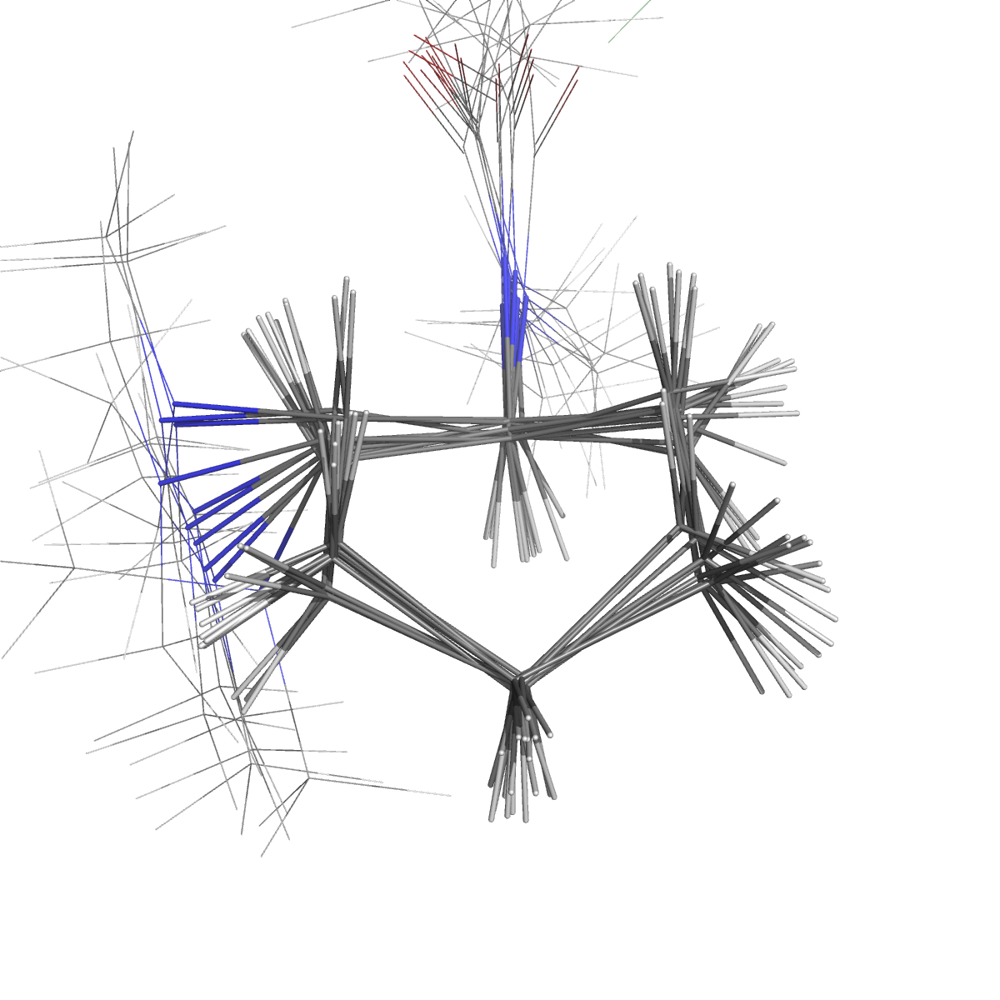

In [16]:
cmd.disable("all")
cmd.enable("cluster_0")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

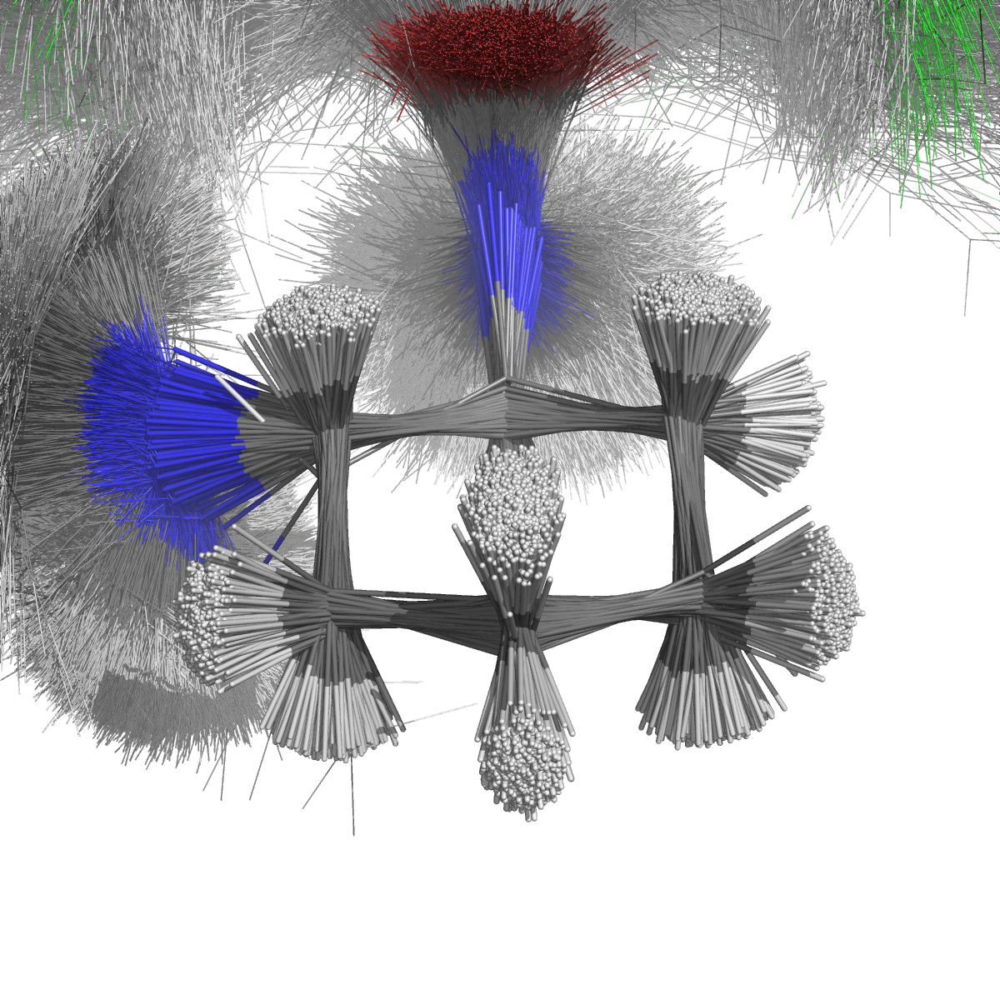

In [17]:
cmd.disable("all")
cmd.enable("cluster_1")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

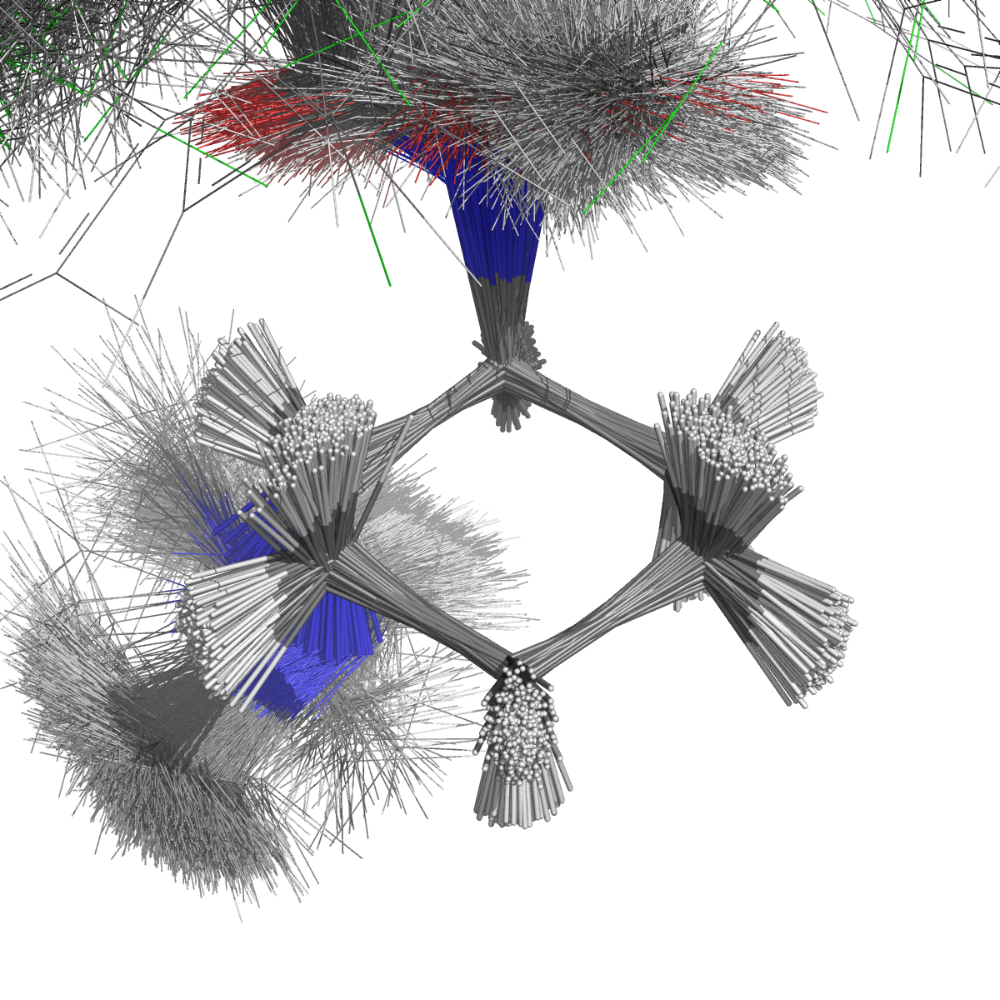

In [18]:
cmd.disable("all")
cmd.enable("cluster_2")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

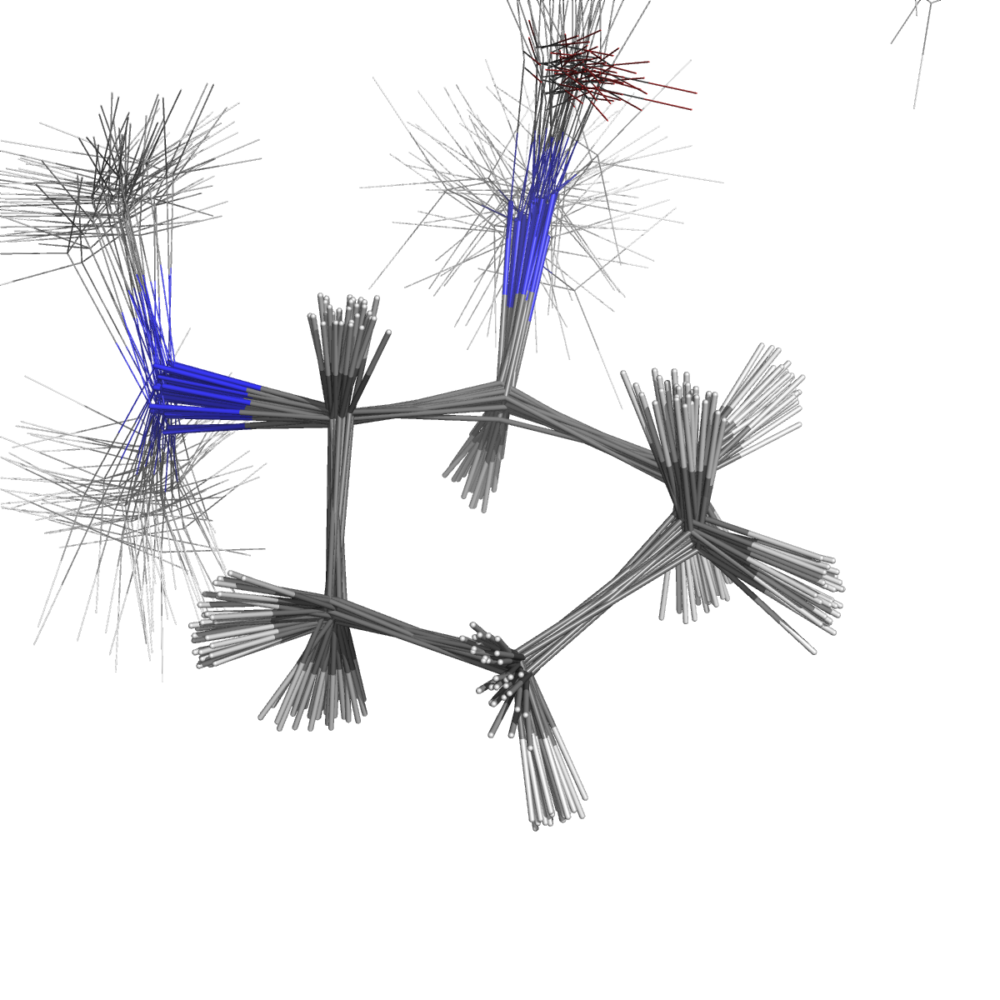

In [19]:
cmd.disable("all")
cmd.enable("cluster_3")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

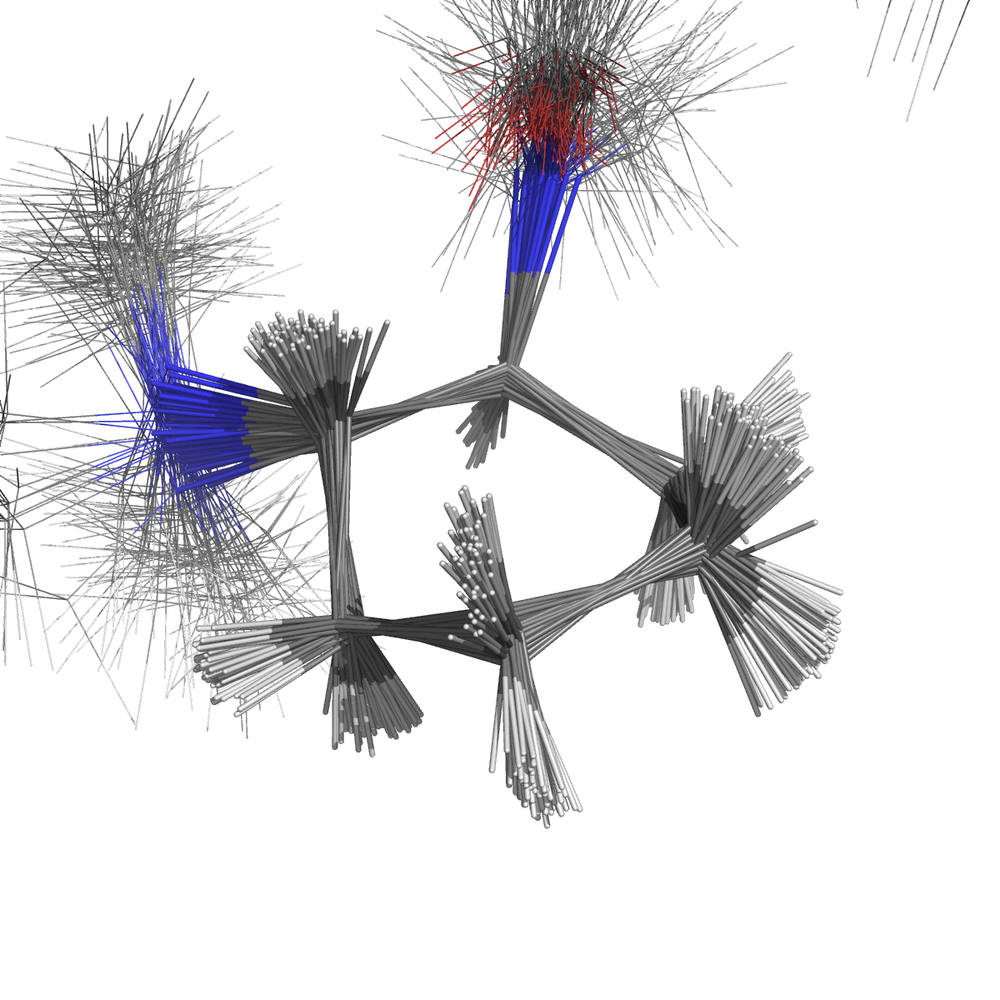

In [20]:
cmd.disable("all")
cmd.enable("cluster_4")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

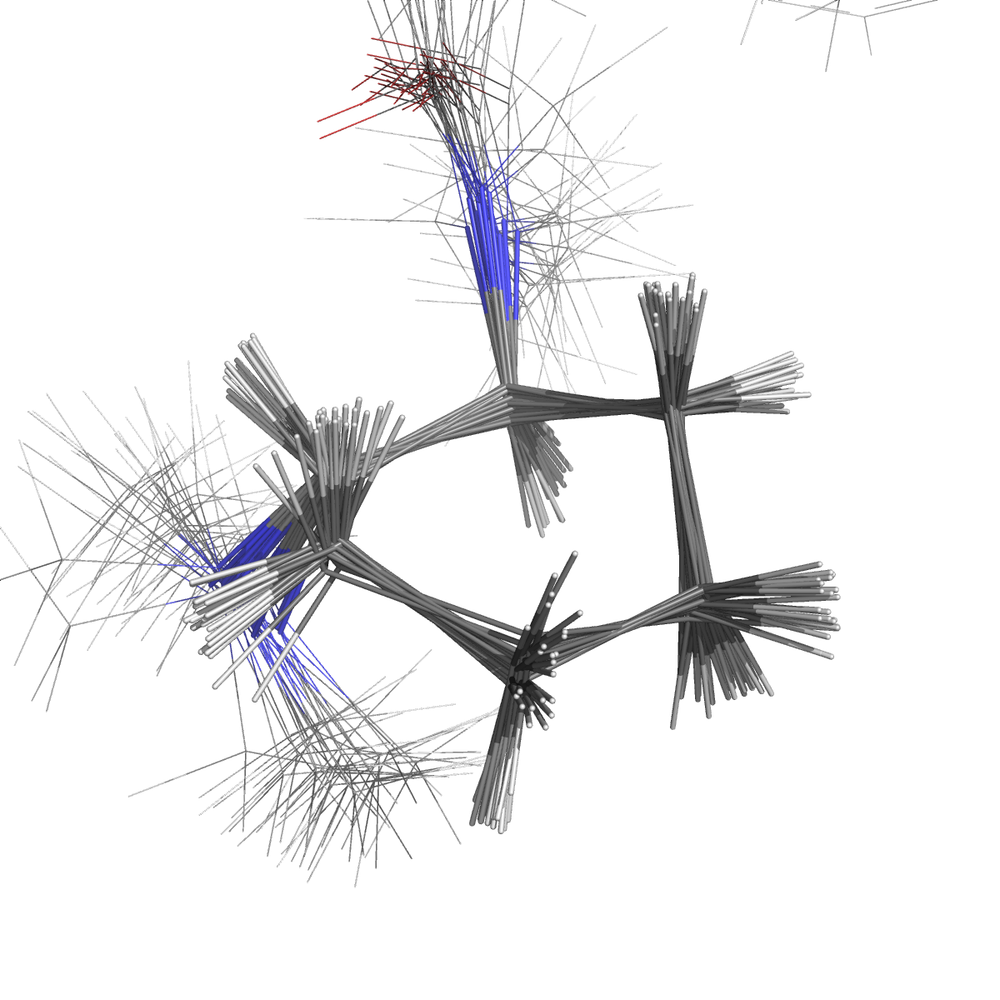

In [21]:
cmd.disable("all")
cmd.enable("cluster_5")

cmd.set_view([ \
     0.118029088,    0.703727722,    0.700597107,\
     0.418340147,   -0.675102592,    0.607642889,\
     0.900588870,    0.221366987,   -0.374078453,\
     0.000015859,   -0.000041685,  -21.208766937,\
    17.857528687,   21.664283752,   18.832725525,\
    12.701323509,   29.738876343,  -20.000000000 ])

cmd.ipython_image(width=1200, height=1200, dpi=300, ray=1)

In [22]:
def compute_angles(structure, plane_atoms_ids, line_atoms_ids):
  # Get the number of states
  num_states = cmd.count_states(structure)

  # Get the coordinates of each of the plane atoms for every state
  plane_coords = []
  for state in (range(1, num_states + 1)):
    state_plane_coords = []
    plane_atoms_ids_str = "id " + " or id ".join(map(str, plane_atoms_ids))
    state_plane_coords.append(np.array(cmd.get_model(f"{structure} and ({plane_atoms_ids_str})", state=state).get_coord_list()[0]))
    plane_coords.append(state_plane_coords)
  plane_coords = np.array(plane_coords)
  
  # Compute the normal vector of each plane
  planes_normal = []
  for state in (range(1, num_states + 1)):
    plane_mean = np.mean(plane_coords[state - 1], axis=0)
    plane_coords_centered = plane_coords[state - 1] - plane_mean
    plane_u, plane_s, plane_vh = np.linalg.svd(plane_coords_centered, full_matrices=False)
    plane_normal_vector = plane_vh[-1]
    plane_normal = plane_normal_vector / np.linalg.norm(plane_normal_vector)
    planes_normal.append(plane_normal)
    

  # Get the coordinates of each of the line atoms for every state
  line_coords = []
  for state in (range(1, num_states + 1)):
    line_plane_coords = {}
    for name, atoms_ids in line_atoms_ids.items():
      line_plane_coords[name] = [np.array((cmd.get_model(f"{structure} and id {atoms_ids[0]}", state=state)).atom[0].coord),
                                np.array((cmd.get_model(f"{structure} and id {atoms_ids[1]}", state=state)).atom[0].coord)]
    line_coords.append(line_plane_coords)

  # Compute the normal vector of each line
  lines_normal = []
  for i in range(0, len(line_coords)):
      normal = {}
      for key, value in line_coords[i].items():
          a, b = value
          v = b - a
          normal[key] = v / np.linalg.norm(v)
      lines_normal.append(normal)

  # Compute the angle between each plane and each line
  states_angles = []
  for i in range(0, len(planes_normal)):
      line_angle = {}
      for key, value in lines_normal[i].items():
          dot_product = np.dot(planes_normal[i], value)
          line_magnitude = np.linalg.norm(value)
          cos_theta = dot_product / (np.linalg.norm(planes_normal[i]) * line_magnitude)
          line_angle[key] = 90 - np.degrees(np.arccos(np.clip(cos_theta, -1.0, 1.0)))
      states_angles.append(line_angle)

  # Get the angles of all states for each line atom pairs
  angles_all = {key: [] for key in line_atoms_ids}
  for state_angles in states_angles:
      for key, angle in state_angles.items():
          angles_all[key].append(angle)

  # Print results
  print(structure)
  for key, values in angles_all.items():
      print(f"{key}: Mean = {round(statistics.mean(values), 2)}, Std Dev = {round(statistics.stdev(values), 2)}, Max = {round(max(values), 2)}, Min = {round(min(values), 2)}")

In [23]:
# Cluster 0
structure = "cluster_0"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_0
C1': Mean = -68.63, Std Dev = 7.03, Max = -58.49, Min = -81.64
C2'H1: Mean = 62.61, Std Dev = 12.56, Max = 75.19, Min = 41.4
C2'H2: Mean = -22.76, Std Dev = 21.26, Max = 2.99, Min = -51.58
C3'H1: Mean = 62.74, Std Dev = 10.97, Max = 77.51, Min = 43.85
C3'H2: Mean = -28.68, Std Dev = 21.99, Max = 7.37, Min = -56.37
C4'H1: Mean = 24.87, Std Dev = 8.94, Max = 35.98, Min = 7.02
C4'H2: Mean = -74.62, Std Dev = 5.67, Max = -68.02, Min = -85.48
C5'H1: Mean = 70.36, Std Dev = 18.11, Max = 86.61, Min = 37.55
C5'H2: Mean = -28.91, Std Dev = 20.21, Max = -8.98, Min = -61.26
C6'H1: Mean = 57.86, Std Dev = 16.94, Max = 81.65, Min = 38.25


In [24]:
# Cluster 1
structure = "cluster_1"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_1
C1': Mean = -76.98, Std Dev = 4.46, Max = -55.26, Min = -89.29
C2'H1: Mean = 79.69, Std Dev = 4.3, Max = 89.68, Min = 59.42
C2'H2: Mean = -17.41, Std Dev = 6.68, Max = 10.19, Min = -44.08
C3'H1: Mean = 30.36, Std Dev = 6.61, Max = 57.89, Min = 5.04
C3'H2: Mean = -74.84, Std Dev = 6.19, Max = -43.09, Min = -89.74
C4'H1: Mean = 79.3, Std Dev = 4.38, Max = 89.78, Min = 60.04
C4'H2: Mean = -12.93, Std Dev = 6.54, Max = 9.94, Min = -39.78
C5'H1: Mean = 16.9, Std Dev = 6.62, Max = 48.74, Min = -5.54
C5'H2: Mean = -76.35, Std Dev = 4.28, Max = -53.45, Min = -89.74
C6'H1: Mean = 78.05, Std Dev = 5.44, Max = 89.64, Min = 36.0


In [25]:
# Cluster 2
structure = "cluster_2"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_2
C1': Mean = -35.92, Std Dev = 7.3, Max = -12.15, Min = -64.38
C2'H1: Mean = 24.21, Std Dev = 6.98, Max = 51.02, Min = 1.54
C2'H2: Mean = -74.81, Std Dev = 5.74, Max = -51.2, Min = -89.13
C3'H1: Mean = 82.12, Std Dev = 4.49, Max = 89.61, Min = 61.42
C3'H2: Mean = -16.97, Std Dev = 7.28, Max = 9.14, Min = -40.53
C4'H1: Mean = 27.72, Std Dev = 6.57, Max = 50.47, Min = 9.28
C4'H2: Mean = -75.68, Std Dev = 5.71, Max = -55.4, Min = -89.67
C5'H1: Mean = 77.56, Std Dev = 4.76, Max = 89.17, Min = 54.13
C5'H2: Mean = -15.53, Std Dev = 6.88, Max = 4.31, Min = -50.77
C6'H1: Mean = 14.57, Std Dev = 7.52, Max = 50.8, Min = -4.13


In [26]:
# Cluster 3
structure = "cluster_3"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_3
C1': Mean = -76.51, Std Dev = 6.56, Max = -61.84, Min = -88.91
C2'H1: Mean = 25.96, Std Dev = 5.93, Max = 39.71, Min = 10.64
C2'H2: Mean = -64.36, Std Dev = 4.65, Max = -55.27, Min = -72.92
C3'H1: Mean = 72.23, Std Dev = 6.97, Max = 84.65, Min = 55.48
C3'H2: Mean = -0.43, Std Dev = 7.62, Max = 13.56, Min = -20.87
C4'H1: Mean = 42.12, Std Dev = 7.39, Max = 53.57, Min = 25.45
C4'H2: Mean = -52.05, Std Dev = 8.22, Max = -35.54, Min = -68.79
C5'H1: Mean = 18.09, Std Dev = 10.7, Max = 41.67, Min = 4.59
C5'H2: Mean = -80.27, Std Dev = 6.3, Max = -61.1, Min = -88.5
C6'H1: Mean = 82.61, Std Dev = 3.96, Max = 89.33, Min = 72.22


In [27]:
# Cluster 4
structure = "cluster_4"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_4
C1': Mean = -55.93, Std Dev = 9.3, Max = -37.6, Min = -76.95
C2'H1: Mean = 15.78, Std Dev = 7.12, Max = 41.43, Min = 1.9
C2'H2: Mean = -75.61, Std Dev = 5.53, Max = -55.34, Min = -89.86
C3'H1: Mean = 74.11, Std Dev = 6.53, Max = 86.99, Min = 51.48
C3'H2: Mean = -19.13, Std Dev = 10.83, Max = 1.06, Min = -44.62
C4'H1: Mean = 63.65, Std Dev = 6.34, Max = 76.54, Min = 46.43
C4'H2: Mean = -25.86, Std Dev = 8.75, Max = -11.04, Min = -44.28
C5'H1: Mean = 3.33, Std Dev = 6.54, Max = 18.5, Min = -13.42
C5'H2: Mean = -72.52, Std Dev = 6.19, Max = -59.89, Min = -87.26
C6'H1: Mean = 69.93, Std Dev = 6.65, Max = 85.2, Min = 52.18


In [28]:
# Cluster 5
structure = "cluster_5"
plane_atoms_ids = (4, 5, 6, 7, 8, 9)

line_atoms_ids = {"C1'":(9, 38),
                  "C2'H1": ( 8, 36), "C2'H2": ( 8, 37),
                  "C3'H1": ( 7, 34), "C3'H2": ( 7, 35),
                  "C4'H1": ( 6, 32), "C4'H2": ( 6, 33),
                  "C5'H1": ( 5, 30), "C5'H2": ( 5, 31),
                  "C6'H1": ( 4, 29)
                 }

compute_angles(structure, plane_atoms_ids, line_atoms_ids)

cluster_5
C1': Mean = -63.55, Std Dev = 6.11, Max = -53.01, Min = -75.0
C2'H1: Mean = 77.19, Std Dev = 4.93, Max = 86.56, Min = 69.53
C2'H2: Mean = -6.36, Std Dev = 6.46, Max = 3.64, Min = -20.72
C3'H1: Mean = 31.53, Std Dev = 8.9, Max = 45.73, Min = 13.96
C3'H2: Mean = -70.0, Std Dev = 8.4, Max = -56.25, Min = -84.89
C4'H1: Mean = 50.58, Std Dev = 12.56, Max = 75.58, Min = 30.34
C4'H2: Mean = -54.64, Std Dev = 13.45, Max = -22.42, Min = -76.01
C5'H1: Mean = 76.78, Std Dev = 7.16, Max = 89.59, Min = 54.72
C5'H2: Mean = -15.77, Std Dev = 9.52, Max = 1.85, Min = -40.9
C6'H1: Mean = 32.19, Std Dev = 6.31, Max = 43.29, Min = 19.01


## Cluster structures based on torsion angle of the aromatic ring

In [29]:
# Extract torsion angles across all states
C1 = "U48800 and id 12"
C2 = "U48800 and id 14"
C3 = "U48800 and id 15"
C4 = "U48800 and id 16"

torsion_angles = []
for state in range(1, num_states + 1):
    C1C2C3C4 = cmd.get_dihedral(C1, C2, C3, C4, state=state)
    torsion_angles.append(C1C2C3C4)

# Assuming torsion_angles is a list of (torsion_1, torsion_2) tuples
df = pd.DataFrame(torsion_angles, columns=['C1C2C3C4'])

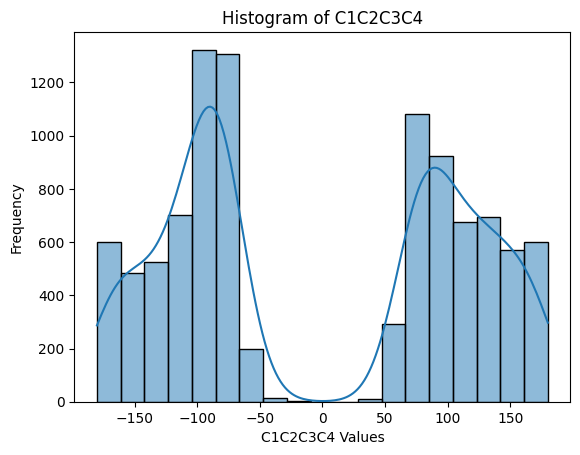

In [30]:
# Add a 'State' column to the DataFrame
df['State'] = range(1, len(df) + 1)

# Assuming df is your DataFrame and it contains a column named 'C1C2C3C4'
sns.histplot(df['C1C2C3C4'], kde=True)  # kde=True adds a Kernel Density Estimate plot on top

plt.title('Histogram of C1C2C3C4')
plt.xlabel('C1C2C3C4 Values')
plt.ylabel('Frequency')
plt.show()

In [31]:
# Define clusters
df['Cluster'] = (df['C1C2C3C4'] > 0).astype(int)

# Count the number of points in each cluster
cluster_counts = df['Cluster'].value_counts()

# Calculate the percentage of points in each cluster
cluster_percentages = cluster_counts / len(df) * 100

# Print cluster counts and percentages
for cluster_id, count in cluster_counts.items():
    percentage = cluster_percentages[cluster_id]
    print(f"Cluster {cluster_id}: {count} structures ({percentage:.2f}%)")

# If you want to include outliers (-1 cluster):
if -1 in cluster_counts:
    outlier_count = cluster_counts[-1]
    outlier_percentage = cluster_percentages[-1]
    print(f"Outliers (-1): {outlier_count} points ({outlier_percentage:.2f}%)")

Cluster 0: 5158 structures (51.57%)
Cluster 1: 4843 structures (48.43%)


In [32]:
# Selection string for the atoms of interest
selection = "U48800 and (id 15 or id 16 or id 17 or id 18 or id 19 or id 20)"

# Align all states to the first state
cmd.intra_fit(selection, 1)

[-1.0,
 0.06790977716445923,
 0.04610917717218399,
 0.04599030315876007,
 0.06324643641710281,
 0.05203896388411522,
 0.046693917363882065,
 0.08179954439401627,
 0.09626295417547226,
 0.051594678312540054,
 0.0724441334605217,
 0.04478392377495766,
 0.048912737518548965,
 0.05083676800131798,
 0.04708977788686752,
 0.06192364916205406,
 0.08787386119365692,
 0.09965039789676666,
 0.0957455113530159,
 0.08208130300045013,
 0.06310257315635681,
 0.07572214305400848,
 0.0563005767762661,
 0.07035142183303833,
 0.06246723234653473,
 0.06124778464436531,
 0.065833680331707,
 0.051523610949516296,
 0.061049990355968475,
 0.04606322944164276,
 0.06912524253129959,
 0.05383934825658798,
 0.057631418108940125,
 0.05701513588428497,
 0.05444624647498131,
 0.06973843276500702,
 0.03238178789615631,
 0.043488819152116776,
 0.09073571115732193,
 0.08139755576848984,
 0.0429653525352478,
 0.06270598620176315,
 0.06705304235219955,
 0.063456691801548,
 0.04655127972364426,
 0.058194562792778015,
 0.

In [33]:
# Create a new object for each cluster
cmd.delete("a_cluster_*")
grouped = df.groupby('Cluster')
for cluster, group_df in grouped:
    new_object_name = f"a_cluster_{cluster}"
    states = group_df['State'].tolist()
    
    for state in states:
        cmd.create(new_object_name, "U48800", state, -1)
        
# Hide the original object
cmd.disable("all")

In [34]:
cmd.save("aromatic_cluster_0.sdf", "a_cluster_0", state=0)
cmd.save("aromatic_cluster_1.sdf", "a_cluster_1", state=0)

In [4]:
cmd.load("aromatic_cluster_0.sdf", "a_cluster_0")
cmd.load("aromatic_cluster_1.sdf", "a_cluster_1")

In [5]:
cmd.enable("all")
cmd.hide("all")
cmd.show("lines")
cmd.set("line_width", 2)

# Define atoms to be viewed as transparent
cmd.select("trnsprnt", "not (id 14 or id 15 or id 16 or id 17 or id 18 or id 19 or id 20 or id 21 or id 22 or id 42 or id 43 or id 44 or id 45 or id 46)")

# Define transparent atoms and bonds
cmd.set("line_width", 0.5, "trnsprnt")
cmd.util.cba(104)

In [6]:
# Set all  states to be displayed
cmd.set("all_states", "on")

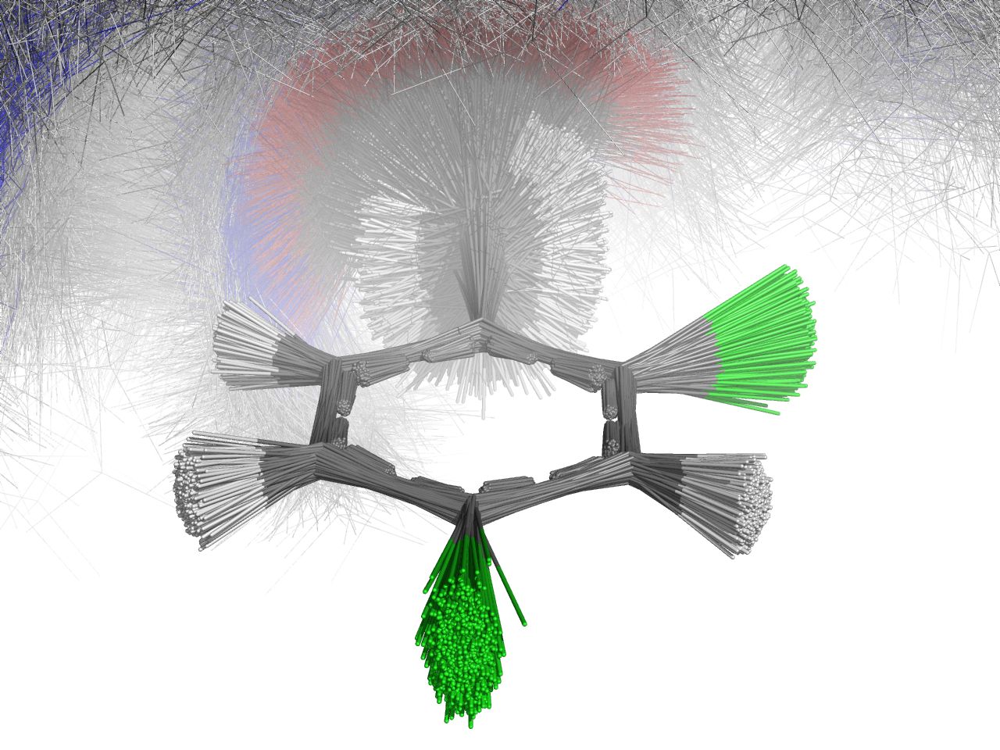

In [7]:
cmd.disable("all")
cmd.enable("a_cluster_0")

cmd.set_view([ \
     0.302145511,    0.853119195,    0.425319761,\
     0.180307612,    0.386972696,   -0.904291868,\
    -0.936053216,    0.349915445,   -0.036901243,\
     0.000034448,    0.000017017,  -17.071765900,\
    21.396516800,   15.321255684,   18.259042740,\
    11.469978333,   22.672609329,  -20.000000000 ])

cmd.ipython_image(width=1280, height=960, dpi=300, ray=1)

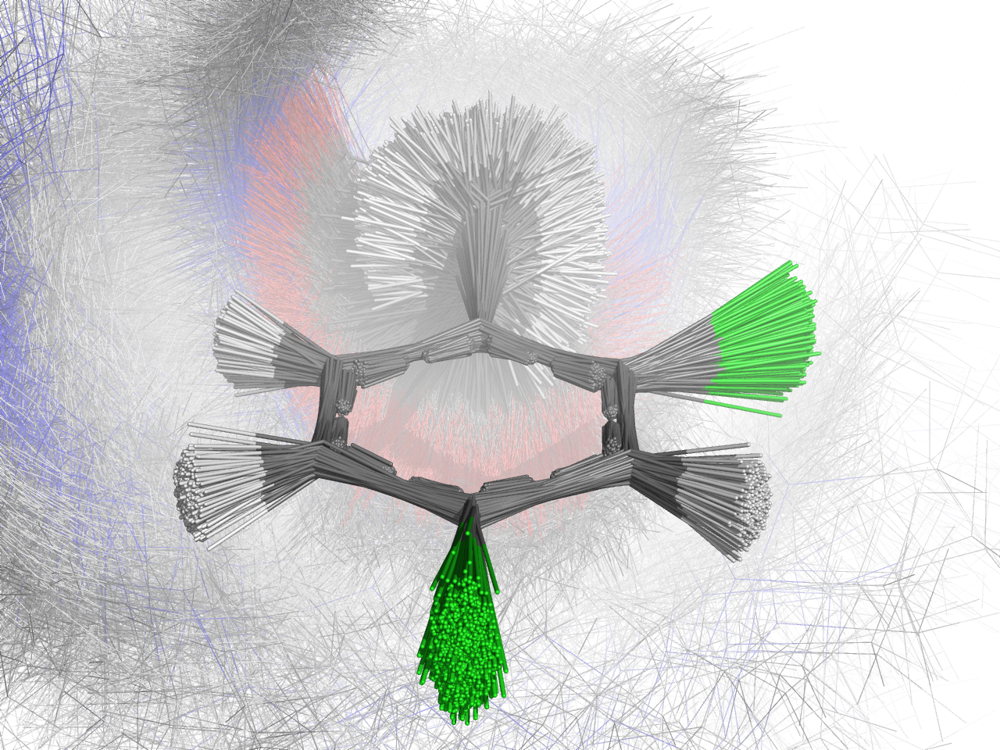

In [8]:
cmd.disable("all")
cmd.enable("a_cluster_1")

cmd.set_view([ \
     0.302145511,    0.853119195,    0.425319761,\
     0.180307612,    0.386972696,   -0.904291868,\
    -0.936053216,    0.349915445,   -0.036901243,\
     0.000034448,    0.000017017,  -17.071765900,\
    21.396516800,   15.321255684,   18.259042740,\
    11.469978333,   22.672609329,  -20.000000000 ])

cmd.ipython_image(width=1280, height=960, dpi=300, ray=1)